# aa

In [2]:
#pip3 install chardet pandas folium  bs4 tqdm numpy matplotlib cartopy display Markdown Latex fiona geopandas
import chardet  
import pandas as pd
import folium
import os
import requests
from bs4 import BeautifulSoup
import csv
from tqdm import tqdm
import zipfile
import numpy as np
import cartopy.feature as cfeature
from IPython.display import display, HTML
import markdown
import webbrowser
import h5py
import geopandas as gpd
import fiona
import pyodbc
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import colorsys
import seaborn as sns
import matplotlib.cm as cm

# Custom CSS
custom_css = """
<style>

    h1{
        font-family: 'Georgia';
        color: #34495e;
        border-bottom: 5px solid #3498db;
        padding-bottom: 10px;
        
    }

    h2{
        font-family: 'Georgia';
        color: #34495e;
        border-bottom: 3px solid #3498db;
        padding-bottom: 10px;
        
    }
        
    p {
        font-family: 'Arial';
        font-size: 16px;
        color: #2c3e50;
        margin-top: 20px;
        
    }
    
    ul{
    
        color: #34495e;
        font-size: 16px;
    
    }
    
</style>
"""
display(HTML(custom_css))

## Differenze dal primo dataset
- L'originale aveva precisione satellitare di circa 16Km, una sola misurazione al giorno
- Il nuovo dataset continene sia rilevazioni mattutine, che pomeridiane. La precisione è ora di 9Km.
<br>

- Il vecchio dataset conteneva solo la tessitura del suolo, sempre con una precisione di 16Km.
- Il nuovo dataset continene descrizioni dettagliate per ogni tipo di terreno - circa 2500 - contenendo numerevoli dati delle proprietà fisiche e chimiche, la  precisione ora è di circa 100m.
<br>

- Disponiamo ora di oltre 500 stazioni meteo all'interno della germania per determinare fattori atmosferici con precisione giornaliera.

In [ ]:
#I commenti sono la trascrizione degli elementi più rilevanti di DESCRIPTION_obsgermany-climate-daily-kl_en.pdf
#Per maggiori dettagli consultare il file

     #    column name       #  description                                              uom           type             format
columns=["STATIONS_ID",     #  Station ID                                               ---           VARCHAR2         ------
         "MESS_DATUM",      #  reference date                                           ---           NUMBER           YYYYMMDD
         "QN_3",            #  quality level of the following columns                   ---           NUMBER           numerical code
         "FX",              #  daily maximum of windgust                                m/s           NUMBER           9990.0
         "FM",              #  daily mean of wind velocity                              m/s           NUMBER           9990.0
         "QN_4",            #  quality level of the following columns                   ---           NUMBER           numerical code
         "RSK",             #  daily precipitation height                               mm            NUMBER           9990.0
         "RSKF",            #  precipitation form                                       num.code      NUMBER           ---
         "SDK",             #  daily sunshine duration                                  h             NUMBER           9990.0
         "SHK_TAG",         #  daily snow depth                                         cm            NUMBER           9990.0
         "NM",              #  daily mean of cloud cover                                1/8           NUMBER           9990.0
         "VPM",             #  daily mean of vapor pressure                             hPa           NUMBER           9990.0
         "PM",              #  daily mean of pressure                                   hPa           NUMBER           9990.0
         "TMK",             #  daily mean of temperature                                °C            NUMBER           9990.0
         "UPM",             #  daily mean of relative humidity                          %             NUMBER           9990.0
         "TXK",             #  daily maximum of temperature at 2 m height               °C            NUMBER           9990.0
         "TNK",             #  daily minimum of temperature at 2m heigh                 °C            NUMBER           9990.0
         "TGK",             # daily minimum of air temperature at 5 cm above ground     °C            NUMBER           9990.0
         "eor"]             #

In [29]:
df=pd.read_csv("datasets/COLONNINE_METEO/df_pulito.csv")
df.columns = df.columns.str.strip()
print(df.columns.tolist())
df

,STATIONS_ID,MESS_DATUM,QN_3,FX,FM,QN_4,RSK,RSKF,SDK,SHK_TAG,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK,eor
0,2290,2020-01-01,10.0,7.1,3.4,9.0,0.0,0.0,7.9,0.0,0.0,4.5,915.6,2.8,60.0,6.6,-0.2,-2.3,eor
1,2290,2020-01-02,10.0,7.8,2.4,9.0,0.0,0.0,7.9,0.0,0.5,3.7,913.0,5.0,43.0,8.5,2.4,-0.6,eor
2,2290,2020-01-03,10.0,18.8,6.5,9.0,1.3,8.0,3.0,0.0,6.8,5.2,910.9,4.1,64.0,7.2,0.7,-0.6,eor
3,2290,2020-01-04,10.0,16.5,7.0,9.0,2.6,8.0,0.0,0.0,7.7,6.4,913.7,1.0,97.0,2.8,-0.8,-0.9,eor
4,2290,2020-01-05,10.0,14.3,3.8,9.0,0.0,8.0,2.0,1.0,6.3,5.5,917.9,-0.3,92.0,1.6,-1.6,-2.6,eor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204287,15801,2020-12-27,10.0,8.5,2.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,eor
204288,15801,2020-12-28,10.0,8.5,2.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,eor
204289,15801,2020-12-29,10.0,7.3,1.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,eor
204290,15801,2020-12-30,10.0,3.7,1.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,eor


Total rows loaded: 204292
Rows after date parsing and month extraction: 204292
Sample data:
        date  month month_str
0 2020-01-01      1         1
1 2020-01-02      1         1
2 2020-01-03      1         1
3 2020-01-04      1         1
4 2020-01-05      1         1


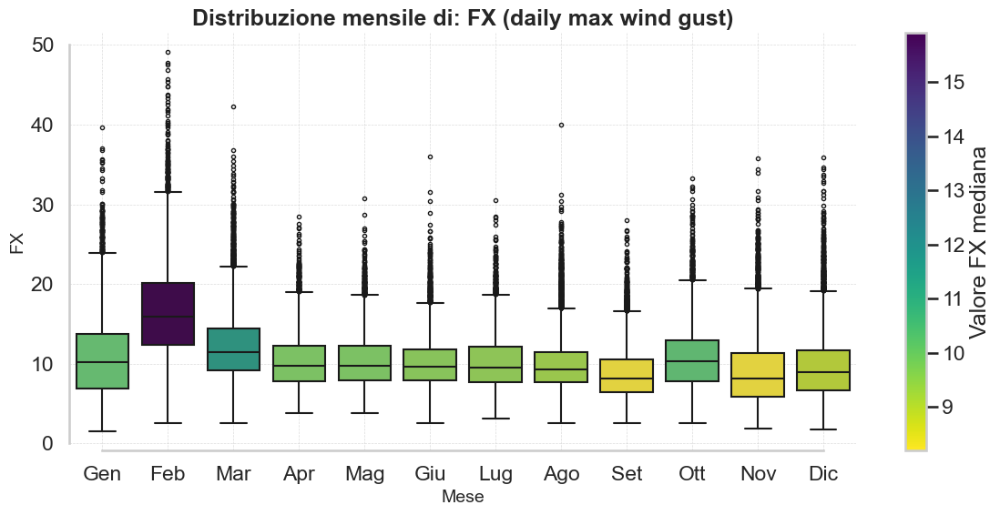

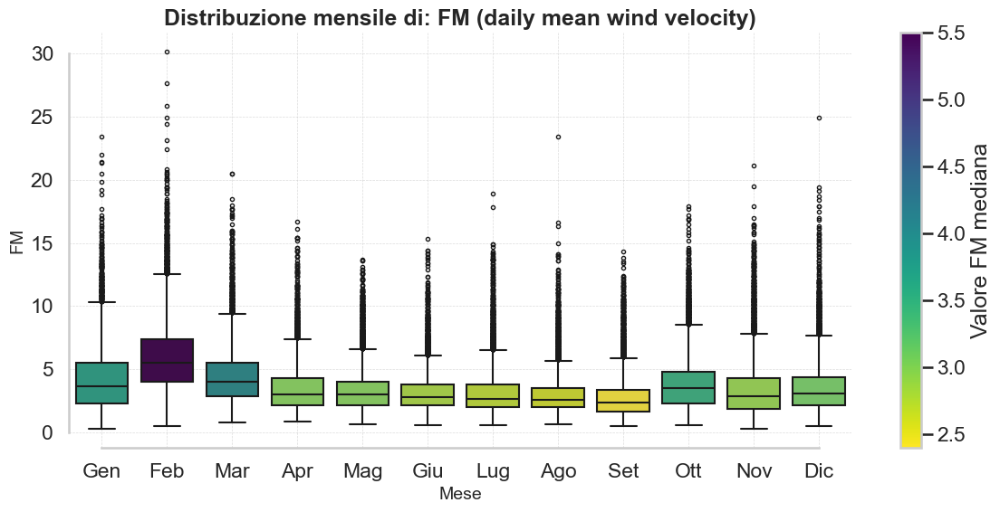

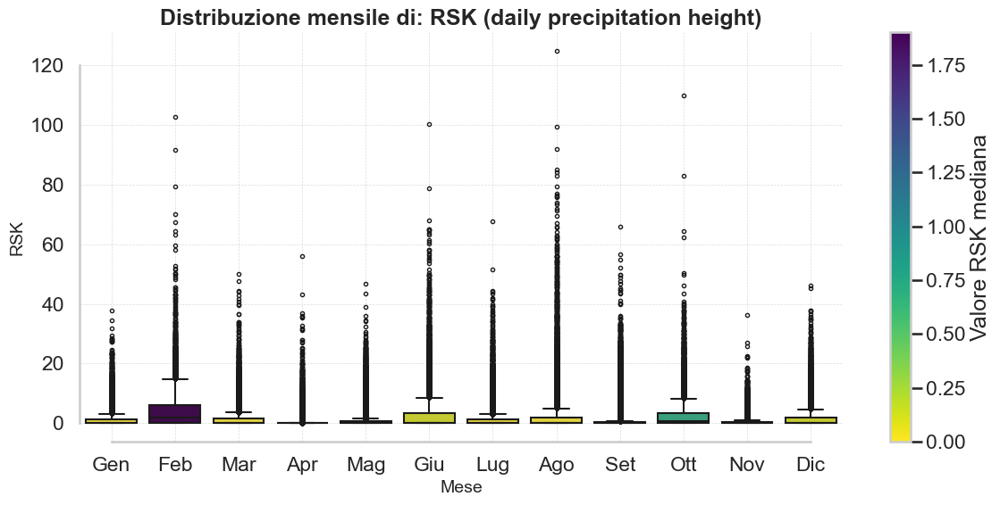

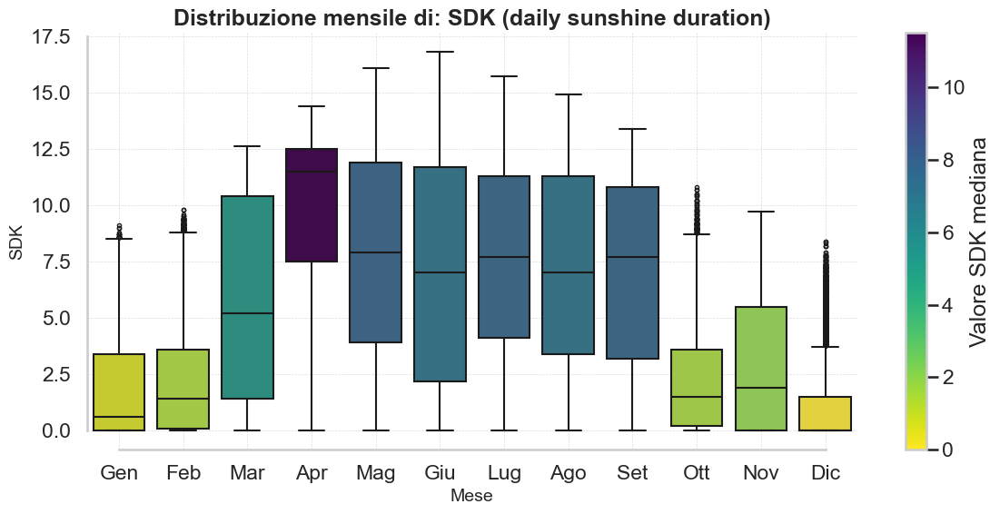

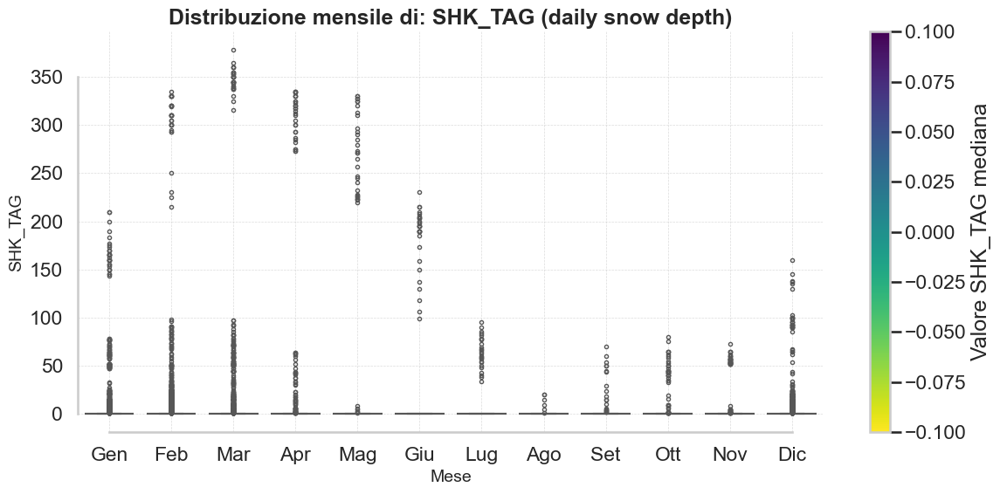

...

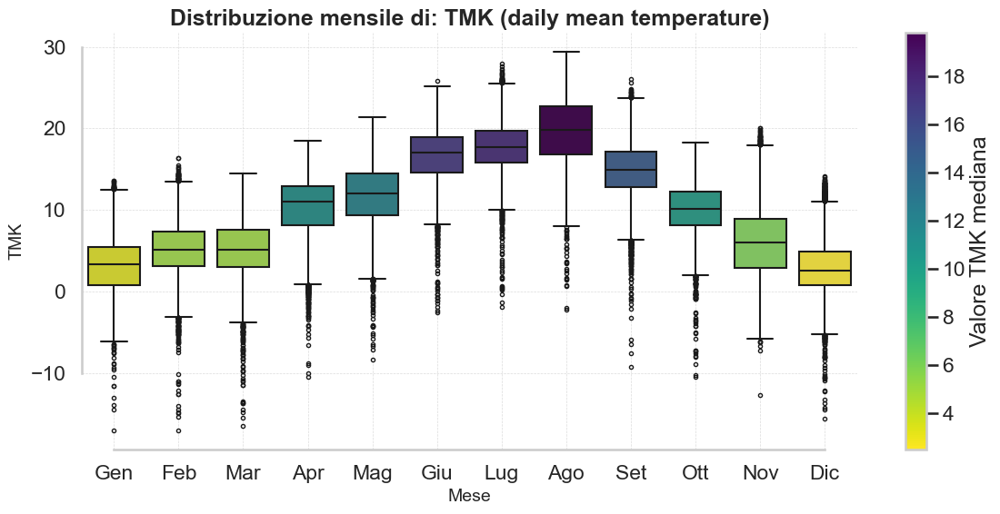

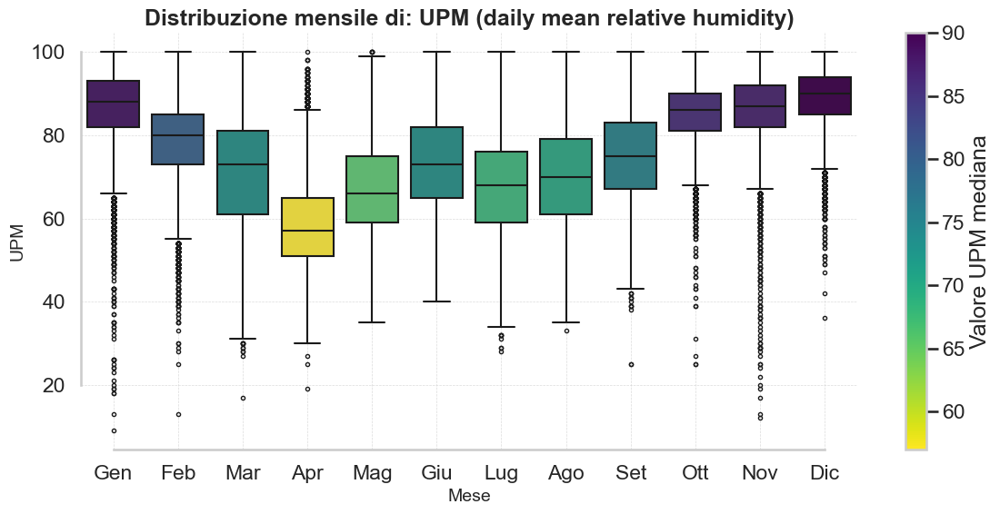

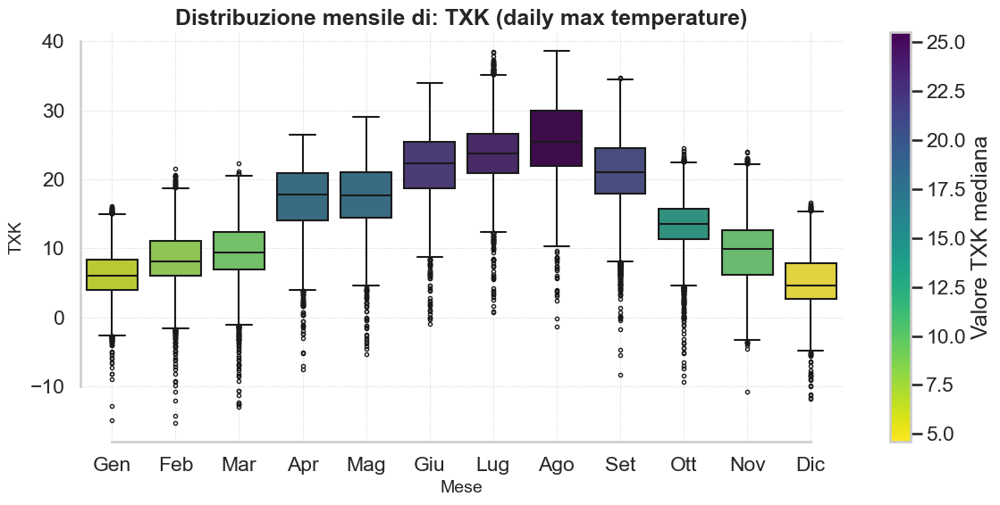

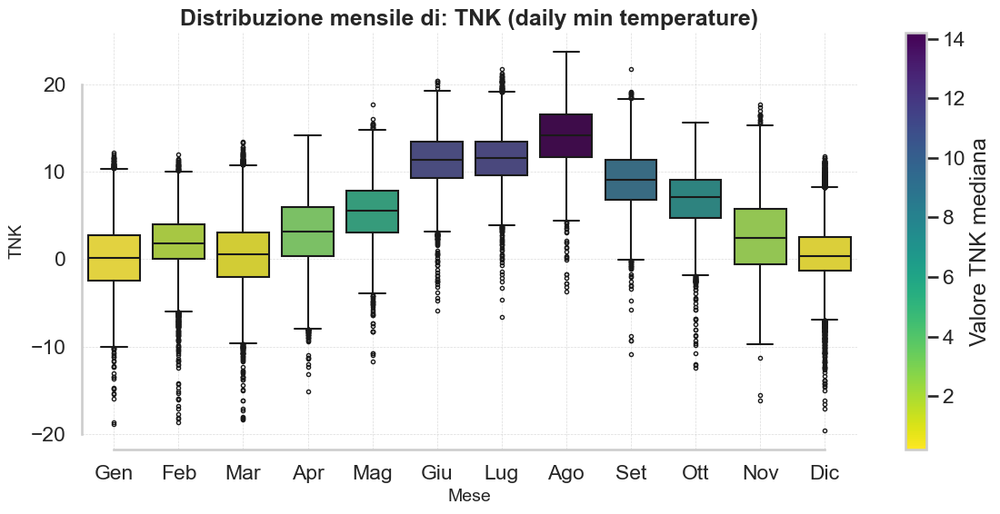

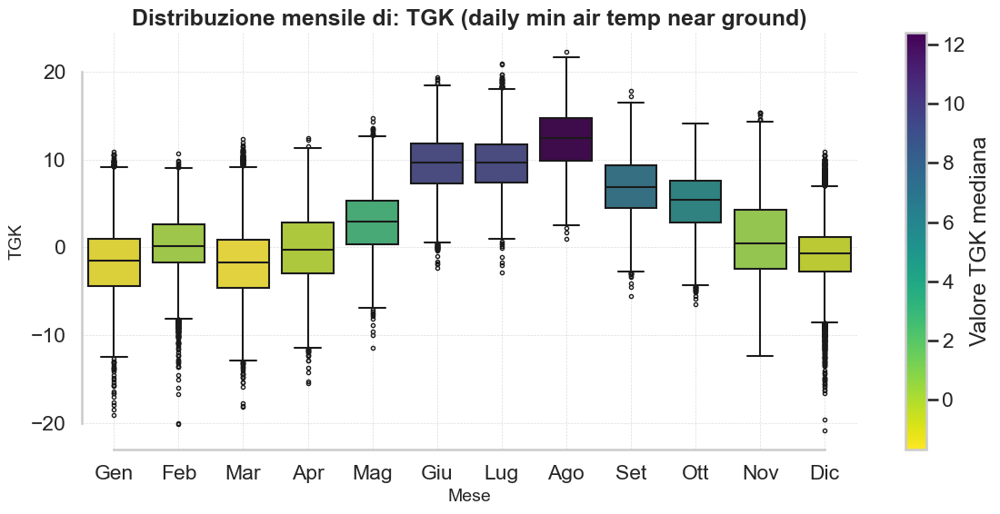

In [55]:
# 1. Load data

df=pd.read_csv("datasets/COLONNINE_METEO/df_pulito.csv")
df.columns = df.columns.str.strip()
# create 'date' column converting MESS_DATUM
df['MESS_DATUM']
df['date'] = pd.to_datetime(df['MESS_DATUM'].astype(str), format='%Y-%m-%d', errors='coerce')
df['month'] = df['date'].dt.month
df = df.dropna(subset=['month'])
df['month_str'] = df['month'].astype(str)
print("Total rows loaded:", len(df))
print("Rows after date parsing and month extraction:", len(df.dropna(subset=['date', 'month'])))
print("Sample data:")
print(df[['date', 'month', 'month_str']].head())
df['month'] = df['month'].astype(int)
df['month_str'] = df['month'].astype(str)

# 4. Define month labels (Italian)
month_labels = ['Gen', 'Feb', 'Mar', 'Apr', 'Mag', 'Giu',
                'Lug', 'Ago', 'Set', 'Ott', 'Nov', 'Dic']

# 5. List of columns to plot (exclude IDs, quality codes, and non-numeric)
columns_to_plot = [
    "FX",      # daily max wind gust
    "FM",      # daily mean wind velocity
    "RSK",     # daily precipitation height
    "SDK",     # daily sunshine duration
    "SHK_TAG", # daily snow depth
    "NM",      # daily mean cloud cover
    "VPM",     # daily mean vapor pressure
    "PM",      # daily mean pressure
    "TMK",     # daily mean temperature
    "UPM",     # daily mean relative humidity
    "TXK",     # daily max temperature
    "TNK",     # daily min temperature
    "TGK"      # daily min air temp near ground
]

labels = [
    "FX (daily max wind gust)",
    "FM (daily mean wind velocity)",
    "RSK (daily precipitation height)",
    "SDK (daily sunshine duration)",
    "SHK_TAG (daily snow depth)",
    "NM (daily mean cloud cover)",
    "VPM (daily mean vapor pressure)",
    "PM (daily mean pressure)",
    "TMK (daily mean temperature)",
    "UPM (daily mean relative humidity)",
    "TXK (daily max temperature)",
    "TNK (daily min temperature)",
    "TGK (daily min air temp near ground)",
]
i=0
# 6. Setup seaborn style
sns.set(style="whitegrid", context='talk')

for col in columns_to_plot:
    # Calculate medians for the colormap
    medians = df.groupby('month_str')[col].median().sort_index()
    
    # Normalize median values for colormap
    norm = Normalize(vmin=medians.min(), vmax=medians.max())
    sm = ScalarMappable(norm=norm, cmap='viridis_r')
    month_palette = {month: sm.to_rgba(medians[month]) for month in medians.index}
    
    plt.figure(figsize=(12, 6))
    
    # Create boxplot
    ax = sns.boxplot(
        x='month_str',
        y=col,
        data=df,
        palette=month_palette,
        hue='month_str',
        linewidth=1.5,
        fliersize=3,
        legend=False
    )
    
    # Customize x-axis labels
    ax.set_xticks(range(12))
    ax.set_xticklabels(month_labels)
    
    # Set titles and labels
    ax.set_title(f"Distribuzione mensile di: {labels[i]}", fontsize=18, weight='bold')
    ax.set_xlabel("Mese", fontsize=14)
    ax.set_ylabel(col, fontsize=14)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    sns.despine(trim=True)
    
    # Add colorbar to show median value scale
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label(f'Valore {col} mediana')
    
    plt.tight_layout()
    
    # Save figure with variable name in filename
    save_path = f"per_presentazione/colonnine_meteo/{col}_monthly_boxplot.png"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    # Optional: show HTML message with saved path if in Jupyter
    html_text = markdown.markdown(f'Grafico salvato in: `{save_path}`')
    display(HTML(html_text))
    i=i+1


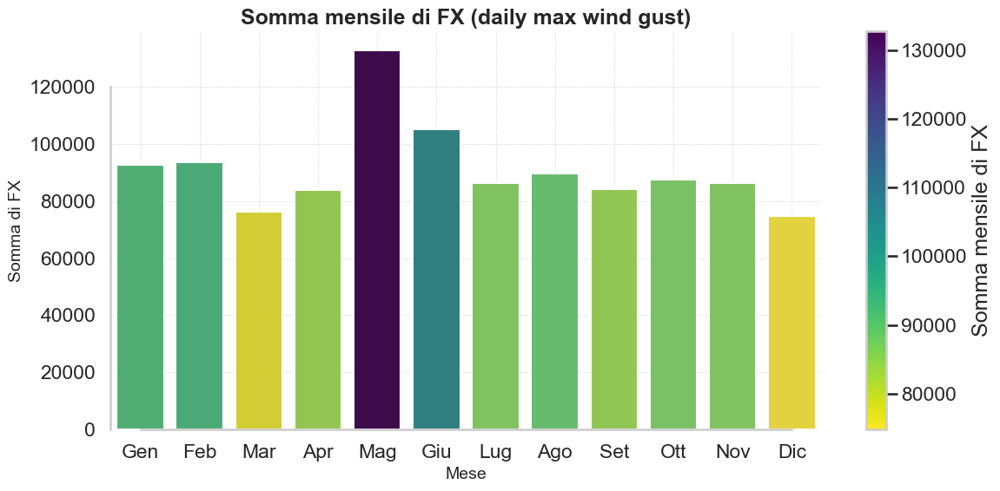

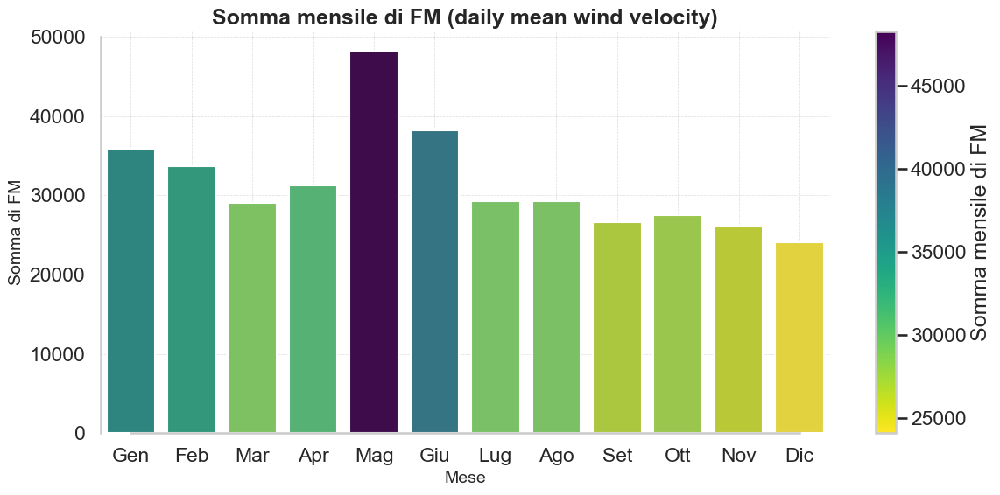

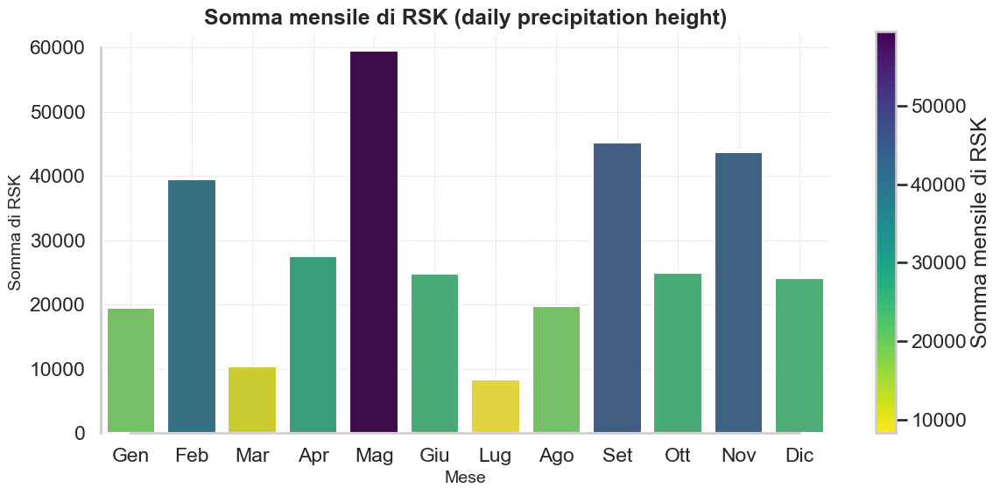

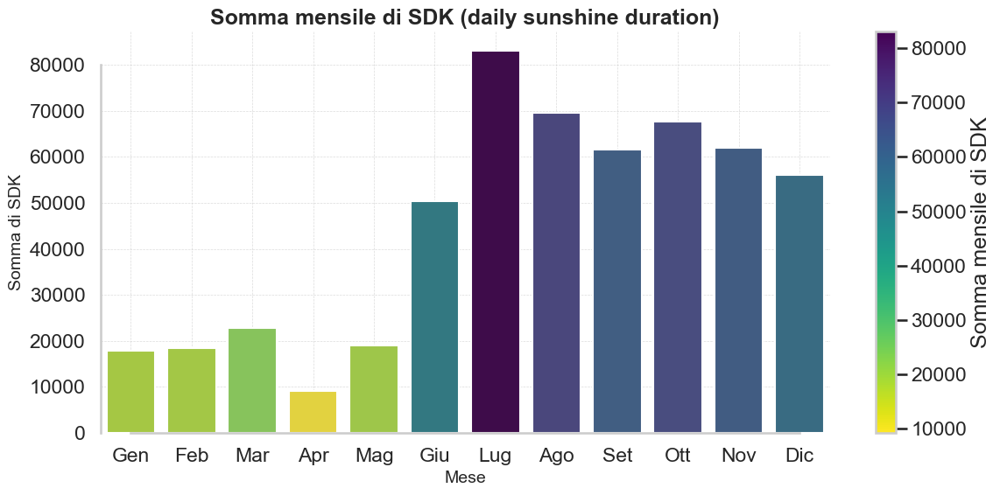

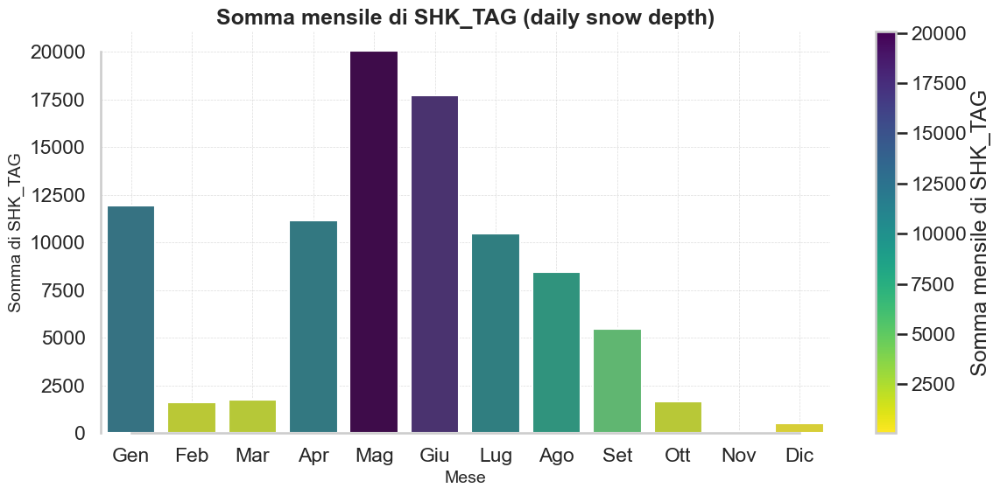

...

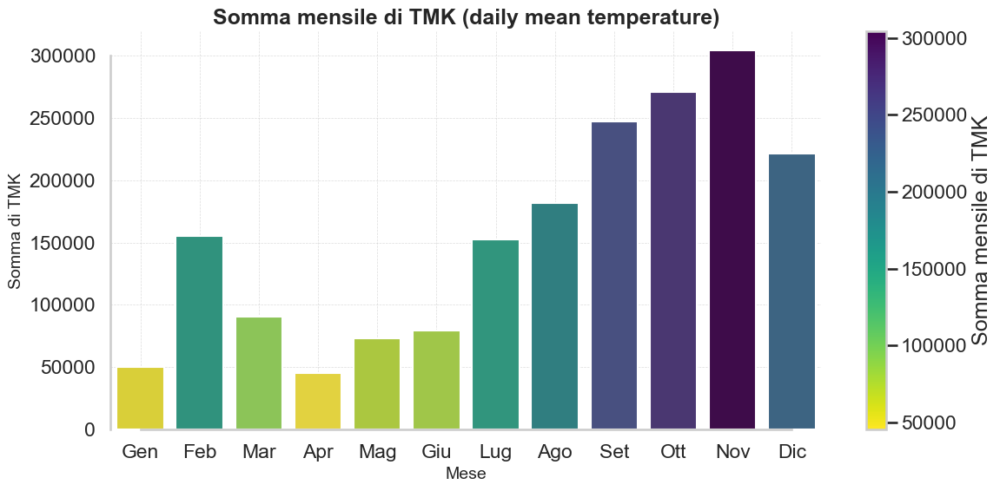

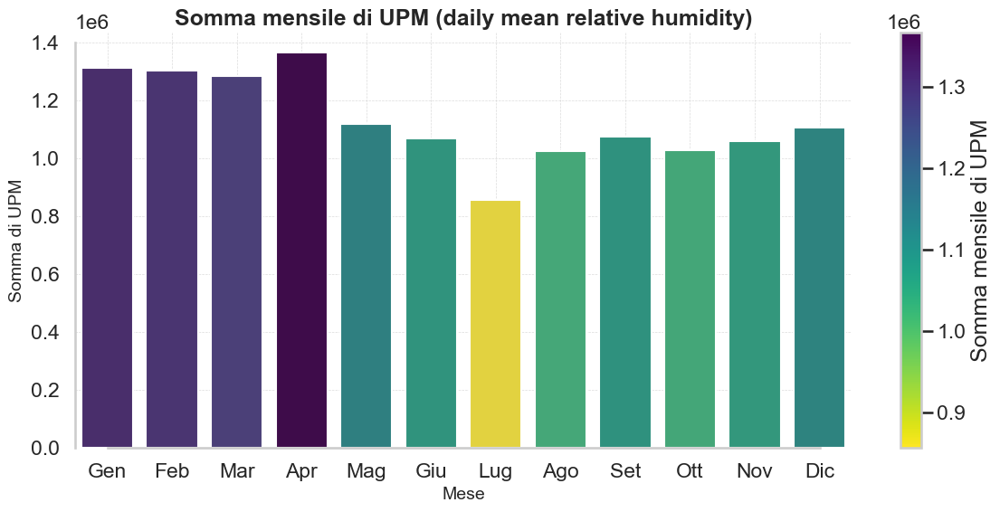

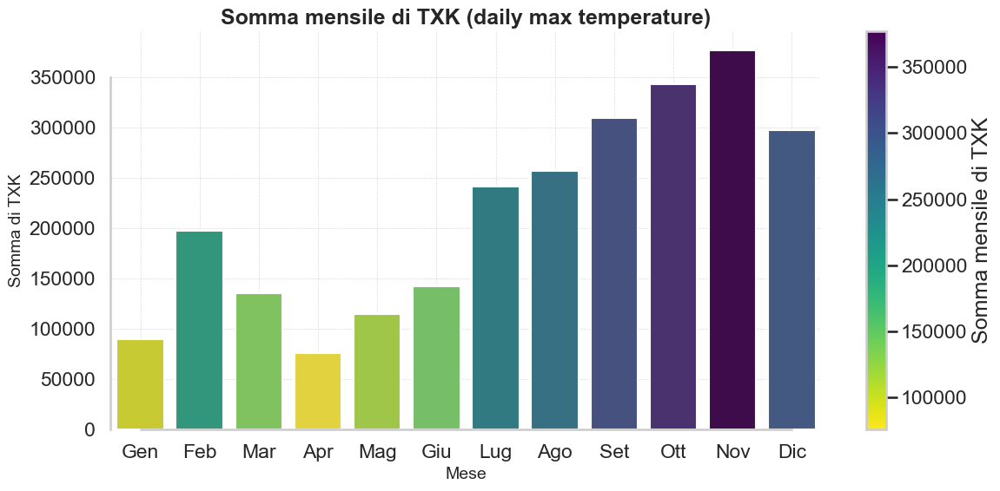

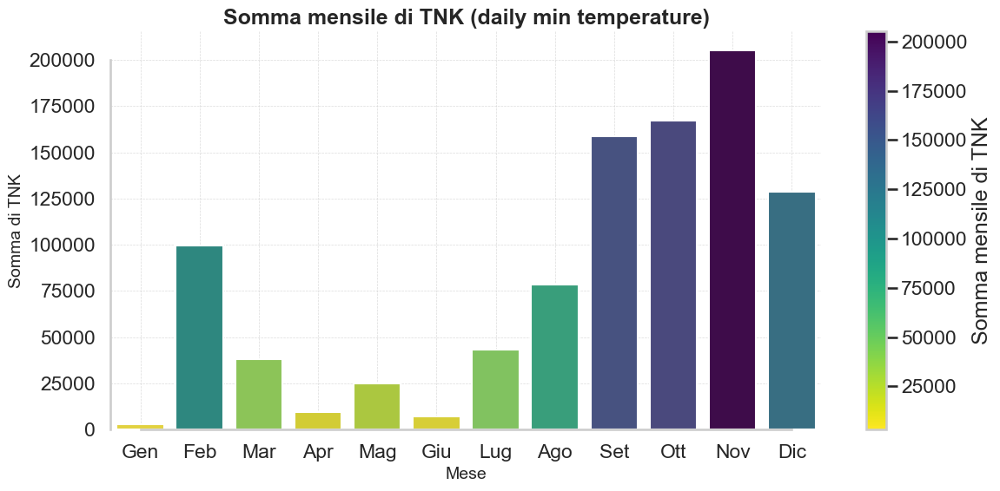

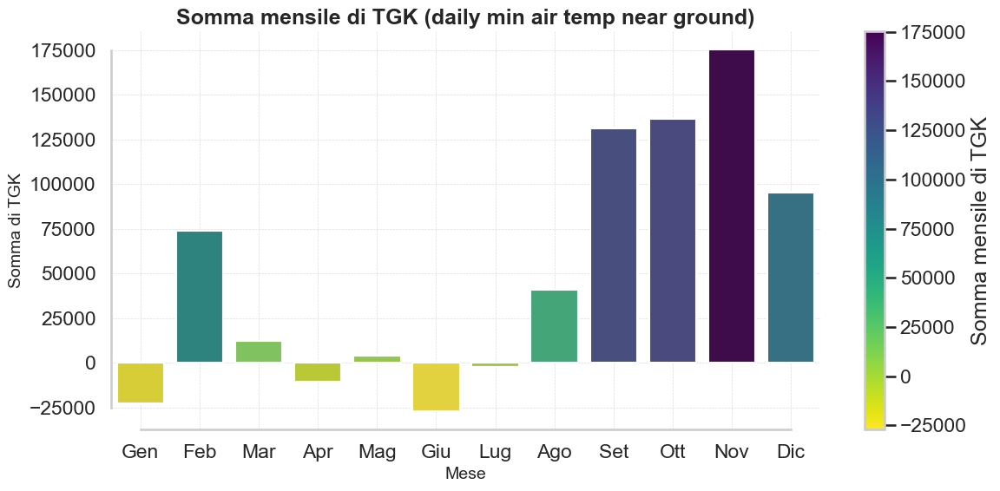

In [56]:
# 3. Define month labels in Italian
month_labels = ['Gen', 'Feb', 'Mar', 'Apr', 'Mag', 'Giu',
                'Lug', 'Ago', 'Set', 'Ott', 'Nov', 'Dic']

# 4. List of weather columns to plot
columns_to_plot = [
    "FX",      # daily max wind gust
    "FM",      # daily mean wind velocity
    "RSK",     # daily precipitation height
    "SDK",     # daily sunshine duration
    "SHK_TAG", # daily snow depth
    "NM",      # daily mean cloud cover
    "VPM",     # daily mean vapor pressure
    "PM",      # daily mean pressure
    "TMK",     # daily mean temperature
    "UPM",     # daily mean relative humidity
    "TXK",     # daily max temperature
    "TNK",     # daily min temperature
    "TGK"      # daily min air temp near ground
]

labels = [
    "FX (daily max wind gust)",
    "FM (daily mean wind velocity)",
    "RSK (daily precipitation height)",
    "SDK (daily sunshine duration)",
    "SHK_TAG (daily snow depth)",
    "NM (daily mean cloud cover)",
    "VPM (daily mean vapor pressure)",
    "PM (daily mean pressure)",
    "TMK (daily mean temperature)",
    "UPM (daily mean relative humidity)",
    "TXK (daily max temperature)",
    "TNK (daily min temperature)",
    "TGK (daily min air temp near ground)",
]
i=0

# 5. Set seaborn style
sns.set(style="whitegrid", context='talk')

# 6. Loop through each column to plot monthly sums
for col in columns_to_plot:
    # Calculate sum per month
    monthly_data = df.groupby('month_str')[col].sum().reset_index().sort_values('month_str')

    # Normalize sums for color mapping
    norm = Normalize(vmin=monthly_data[col].min(), vmax=monthly_data[col].max())
    sm = ScalarMappable(norm=norm, cmap='viridis_r')
    colors = [sm.to_rgba(val) for val in monthly_data[col]]

    # Plot barplot
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(
        x='month_str',
        y=col,
        data=monthly_data,
        palette=colors,
        hue='month_str',
        legend=False
    )

    # Customize x-axis
    ax.set_xticks(range(12))
    ax.set_xticklabels(month_labels)

    # Title and axis labels
    ax.set_title(f"Somma mensile di {labels[i]}", fontsize=18, weight='bold')
    ax.set_xlabel("Mese", fontsize=14)
    ax.set_ylabel(f"Somma di {col}", fontsize=14)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    sns.despine(trim=True)

    # Add colorbar
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label(f'Somma mensile di {col}')

    # Save plot
    plt.tight_layout()
    save_path = f"per_presentazione/colonnine_meteo/{col}_monthly_sum_barplot.png"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

    # Optional display message (useful in Jupyter)
    html_text = markdown.markdown(f'Grafico salvato in: `{save_path}`')
    display(HTML(html_text))
    i=i+1

## Correlazioni?

In [2]:
import os
import requests
from bs4 import BeautifulSoup
from urllib.parse import urlparse

# === Configuration ===
INPUT_FILE = "links.txt"        # The text file containing the HTML content
DOWNLOAD_FOLDER = "downloads"   # Folder where files will be saved

# === Create download folder if not exists ===
os.makedirs(DOWNLOAD_FOLDER, exist_ok=True)

# === Read the file ===
with open(INPUT_FILE, "r", encoding="utf-8") as file:
    html_content = file.read()

# === Parse HTML and extract links ===
soup = BeautifulSoup(html_content, "html.parser")
links = [a.get("href") for a in soup.find_all("a", href=True)]

print(f"Found {len(links)} links.")

# === Download each link ===
for idx, url in enumerate(links, 1):
    try:
        print(f"[{idx}/{len(links)}] Downloading: {url}")

        # Get filename from URL or fallback
        parsed = urlparse(url)
        filename = os.path.basename(parsed.path)
        if not filename:
            filename = f"file_{idx}.html"

        # Download the file
        response = requests.get(url, timeout=10)
        response.raise_for_status()

        # Save to file
        filepath = os.path.join(DOWNLOAD_FOLDER, filename)
        with open(filepath, "wb") as f:
            f.write(response.content)

        print(f"Saved to {filepath}")
    except Exception as e:
        print(f"Failed to download {url}: {e}")


Found 281 links.
[1/281] Downloading: https://openmaps.online/dtm_ger_download/E640N5680.zip
Saved to downloads\E640N5680.zip
[2/281] Downloading: https://openmaps.online/dtm_ger_download/E560N5720.zip


KeyboardInterrupt: 

In [5]:
display(Markdown('*some markdown*'))


*some markdown*

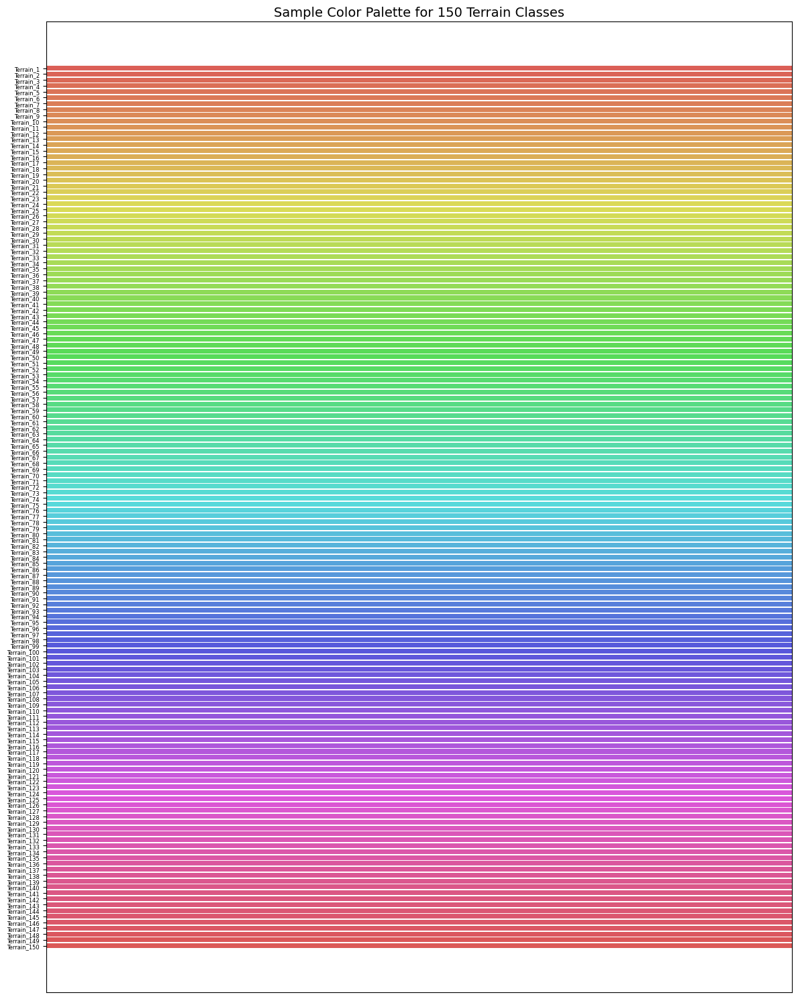

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Simulate terrain class labels (replace with your own if needed)
terrain_classes = [f"Terrain_{i+1}" for i in range(150)]

# Generate 150 distinct colors
colors = sns.color_palette("hls", 150)  # Try "hsv", "husl", or "cubehelix" too

# Create the swatch plot
fig, ax = plt.subplots(figsize=(12, 15))
y_pos = np.arange(len(terrain_classes))

for i, (terrain, color) in enumerate(zip(terrain_classes, colors)):
    ax.barh(i, 1, color=color)

ax.set_yticks(y_pos)
ax.set_yticklabels(terrain_classes, fontsize=6)
ax.set_xticks([])
ax.set_xlim(0, 1)
ax.invert_yaxis()
ax.set_title("Sample Color Palette for 150 Terrain Classes", fontsize=14)

plt.tight_layout()
plt.show()


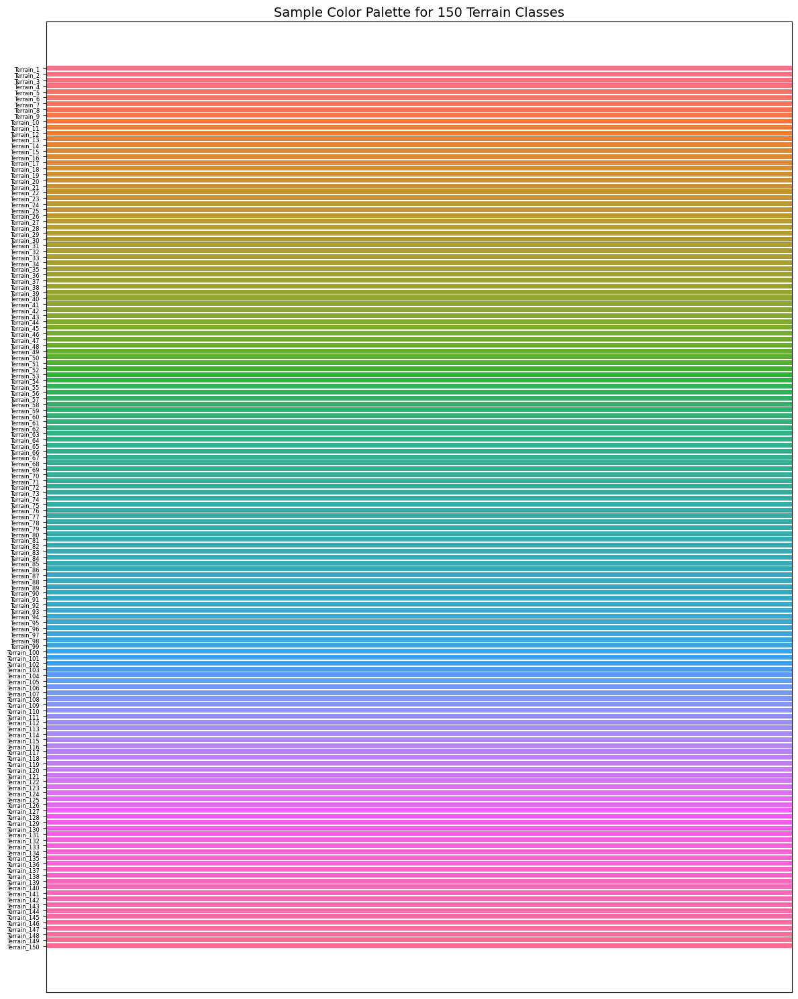

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Simulate terrain class labels (replace with your own if needed)
terrain_classes = [f"Terrain_{i+1}" for i in range(150)]

# Generate 150 distinct colors
colors = sns.color_palette("husl", 150)  # Try "hsv", "", or "cubehelix" too

# Create the swatch plot
fig, ax = plt.subplots(figsize=(12, 15))
y_pos = np.arange(len(terrain_classes))

for i, (terrain, color) in enumerate(zip(terrain_classes, colors)):
    ax.barh(i, 1, color=color)

ax.set_yticks(y_pos)
ax.set_yticklabels(terrain_classes, fontsize=6)
ax.set_xticks([])
ax.set_xlim(0, 1)
ax.invert_yaxis()
ax.set_title("Sample Color Palette for 150 Terrain Classes", fontsize=14)

plt.tight_layout()
plt.show()


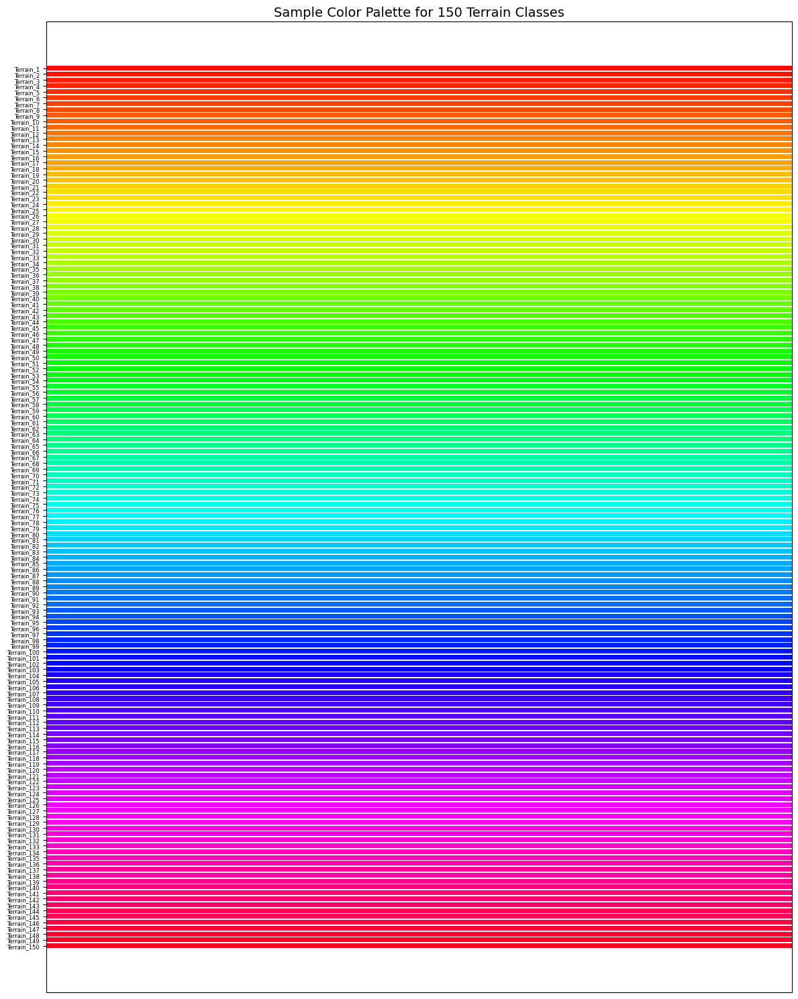

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Simulate terrain class labels (replace with your own if needed)
terrain_classes = [f"Terrain_{i+1}" for i in range(150)]

# Generate 150 distinct colors
colors = sns.color_palette("hsv", 150)  # Try "", "", or "cubehelix" too

# Create the swatch plot
fig, ax = plt.subplots(figsize=(12, 15))
y_pos = np.arange(len(terrain_classes))

for i, (terrain, color) in enumerate(zip(terrain_classes, colors)):
    ax.barh(i, 1, color=color)

ax.set_yticks(y_pos)
ax.set_yticklabels(terrain_classes, fontsize=6)
ax.set_xticks([])
ax.set_xlim(0, 1)
ax.invert_yaxis()
ax.set_title("Sample Color Palette for 150 Terrain Classes", fontsize=14)

plt.tight_layout()
plt.show()


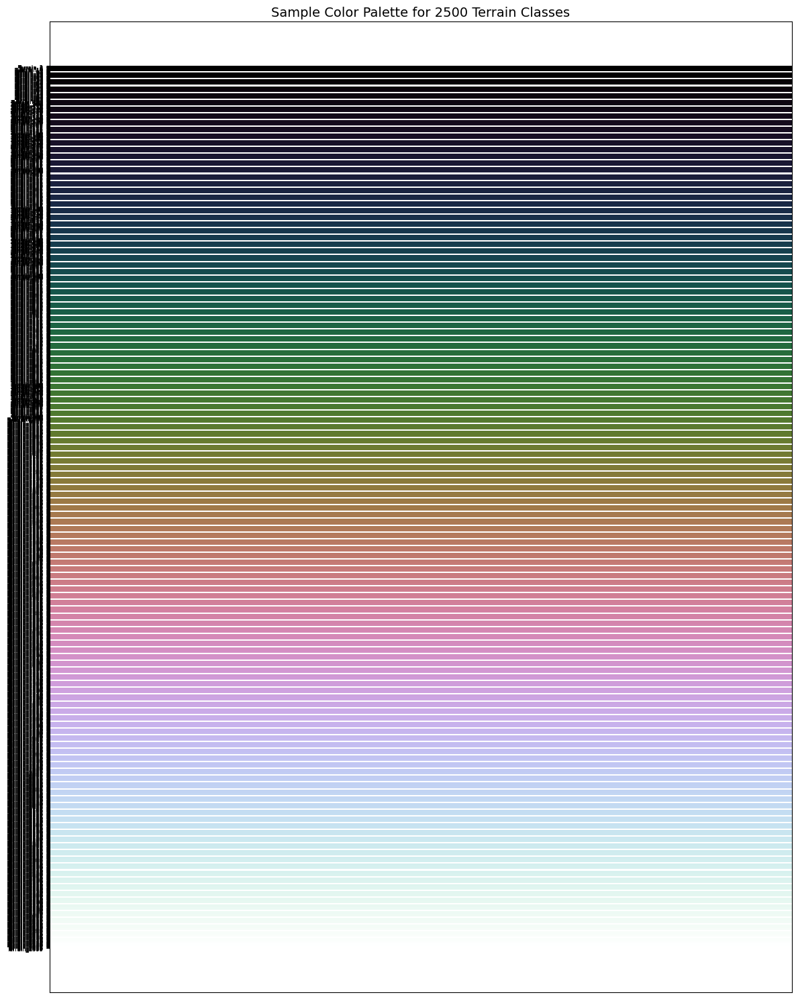

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Simulate terrain class labels (replace with your own if needed)
terrain_classes = [f"Terrain_{i+1}" for i in range(2500)]

# Generate 150 distinct colors
colors = sns.color_palette("cubehelix", 2500)  # Try "", "", or "" too

# Create the swatch plot
fig, ax = plt.subplots(figsize=(12, 15))
y_pos = np.arange(len(terrain_classes))

for i, (terrain, color) in enumerate(zip(terrain_classes, colors)):
    ax.barh(i, 1, color=color)

ax.set_yticks(y_pos)
ax.set_yticklabels(terrain_classes, fontsize=6)
ax.set_xticks([])
ax.set_xlim(0, 1)
ax.invert_yaxis()
ax.set_title("Sample Color Palette for 2500 Terrain Classes", fontsize=14)

plt.tight_layout()
plt.show()


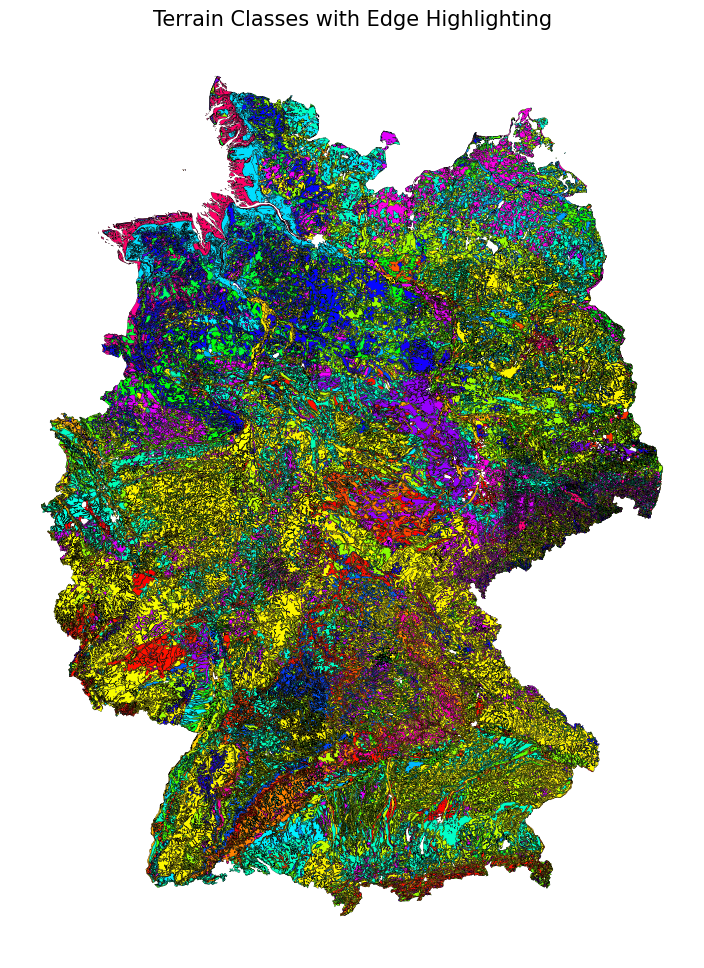

In [7]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Example GeoDataFrame with 'terrain_type' column
gdf = gpd.read_file("buk250_with_soiltypes.geojson")  # or use your existing GeoDataFrame

# Plot using many colors (e.g. hsv colormap), with black edges
gdf.plot(
    column="BOD_FT_ID",
    cmap="hsv",              # or "nipy_spectral", "gist_rainbow"
    edgecolor="black",       # <-- this is the key!
    linewidth=0.2,           # Thin borders help without overpowering
    legend=False,
    figsize=(12, 12)
)

plt.title("Terrain Classes with Edge Highlighting", fontsize=15)
plt.axis("off")
plt.show()
fig.savefig("hsv.png", dpi=300)

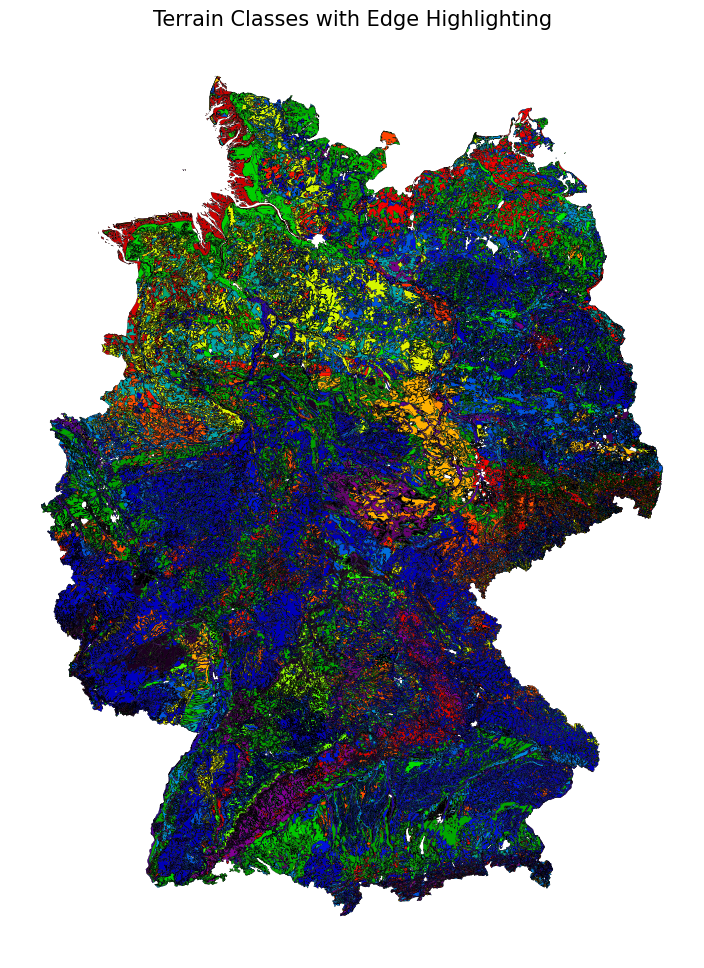

In [8]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Example GeoDataFrame with 'terrain_type' column
gdf = gpd.read_file("buk250_with_soiltypes.geojson")  # or use your existing GeoDataFrame

# Plot using many colors (e.g. hsv colormap), with black edges
gdf.plot(
    column="BOD_FT_ID",
    cmap="nipy_spectral",              # or "", "gist_rainbow"
    edgecolor="black",       # <-- this is the key!
    linewidth=0.2,           # Thin borders help without overpowering
    legend=False,
    figsize=(12, 12)
)

plt.title("Terrain Classes with Edge Highlighting", fontsize=15)
plt.axis("off")
plt.show()
fig.savefig("nipy_spectral.png", dpi=300)


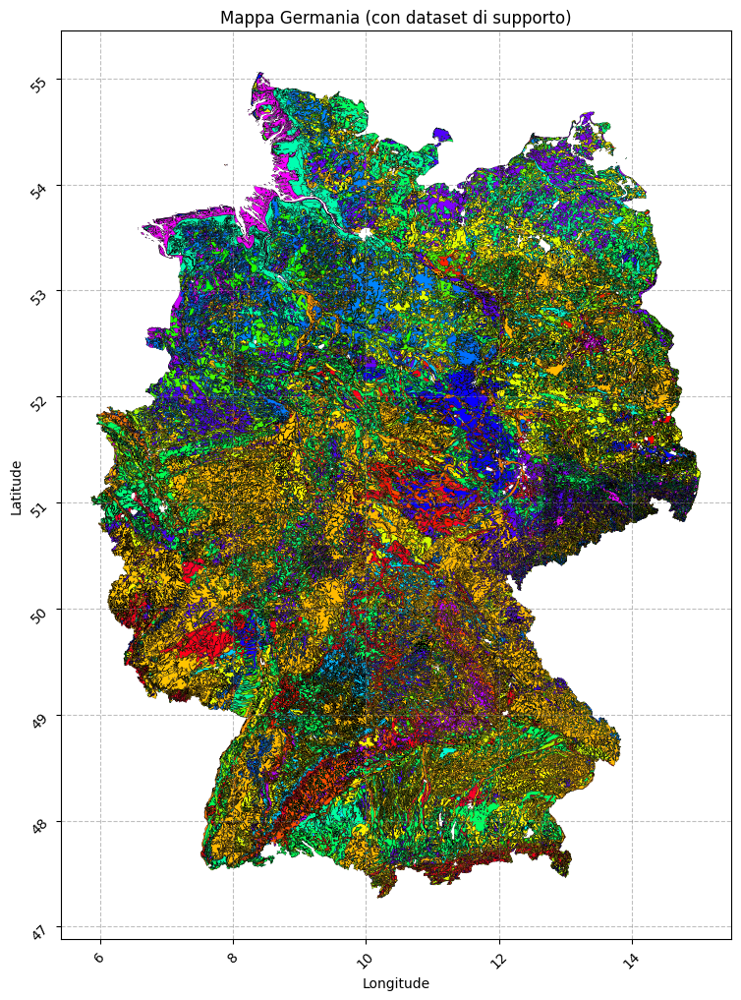

In [11]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Example GeoDataFrame with 'terrain_type' column
gdf = gpd.read_file("buk250_with_soiltypes.geojson")  # or use your existing GeoDataFrame

'''
# Plot using many colors (e.g. hsv colormap), with black edges
gdf.plot(
    column="BOD_FT_ID",
    cmap="gist_rainbow",              # or "", ""
    edgecolor="black",       # <-- this is the key!
    linewidth=0.2,           # Thin borders help without overpowering
    legend=False,
    figsize=(12, 12)
)

plt.title("Terrain Classes with Edge Highlighting", fontsize=15)
plt.axis("off")
plt.show()
fig.savefig("gist_rainbow.png", dpi=300)
'''

# Reproject GeoDataFrame to WGS84 (lat/lon)
gdf_wgs84 =gdf.to_crs(epsg=4326)

# Create the figure and axes FIRST
fig, ax = plt.subplots(figsize=(12, 12))

# Plot the GeoDataFrame on the same axes
gdf_wgs84.plot(
    column="BOD_FT_ID",
    cmap="gist_rainbow",              # or "", ""
    edgecolor="black",       # <-- this is the key!
    linewidth=0.2,           # Thin borders help without overpowering
    legend=False,
    figsize=(12, 12),
    ax=ax
)

# Add titles and labels
ax.set_title("Mappa Germania (con dataset di supporto)")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

# Add latitude/longitude grid
ax.grid(True, which='both', linestyle='--', color='gray', alpha=0.5)

# Rotate tick labels
plt.xticks(rotation=45)
plt.yticks(rotation=45)

# Show the plot
plt.show()

fig.savefig("per_presentazione/analisi_terreno/mappa_precisa.png", dpi=300)
fig.savefig("per_presentazione/analisi_terreno/mappa_precisaHD.png", dpi=3000)


#gdf.plot(column="GEN_ID", cmap="tab20", legend=True)
#gdf

## ora proviamo na roba
ustia patuschia non funzia

GEN_ID unique count: 2172


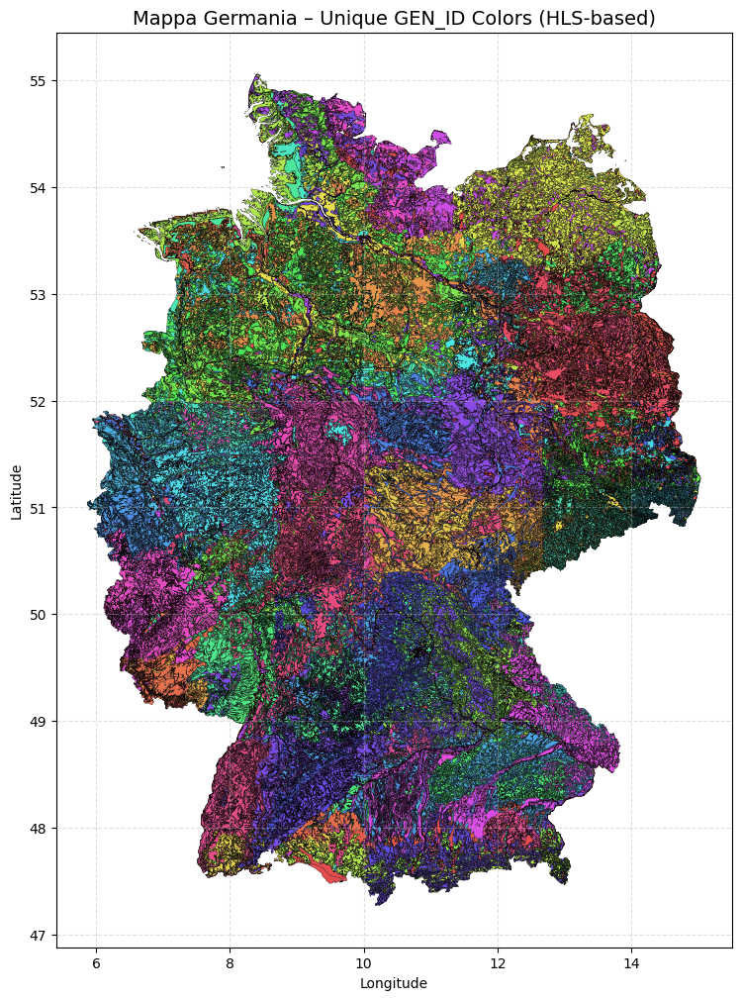

In [10]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import colorsys

gdf = gpd.read_file("buk250_with_soiltypes.geojson")
gdf = gdf.to_crs(epsg=4326)

# Clean and sort GEN_IDs
gdf["GEN_ID"] = gdf["GEN_ID"].astype(str)  # force all to string
unique_ids = sorted(gdf["GEN_ID"].dropna().unique())
n = len(unique_ids)
print(f"GEN_ID unique count: {n}")  # ← check how many there are

# Generate distinct HLS-based colors
def generate_hls_colors(n, lightness=0.6, saturation=0.75):
    return [
        mcolors.to_hex(colorsys.hls_to_rgb(i / n, lightness, saturation))
        for i in range(n)
    ]

# Assign colors to GEN_IDs
color_map = dict(zip(unique_ids, generate_hls_colors(n)))
gdf["color"] = gdf["GEN_ID"].map(color_map)

# Plot
fig, ax = plt.subplots(figsize=(12, 12))
gdf.plot(color=gdf["color"], edgecolor="black", linewidth=0.2, ax=ax)

ax.set_title("Mappa Germania – Unique GEN_ID Colors (HLS-based)", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True, linestyle="--", alpha=0.4)

plt.show()
fig.savefig("per_presentazione/analisi_terreno/mappa_fixed_colors.png", dpi=300)



In [8]:
print(f"Unique GEN_IDs: {gdf_wgs84['GEN_ID'].nunique()}")


Unique GEN_IDs: 2171


In [9]:
print(gdf_wgs84["GEN_ID"].value_counts().head(10))
print(gdf_wgs84["GEN_ID"].dtype)
print(gdf_wgs84["GEN_ID"].isna().sum())

GEN_ID
13.0      4
147.0     3
151.0     3
133.0     3
16.0      3
17.0      3
144.0     3
135.0     3
1339.0    3
1118.0    3
Name: count, dtype: int64
float64
6653


Plotting 2171 unique GEN_IDs


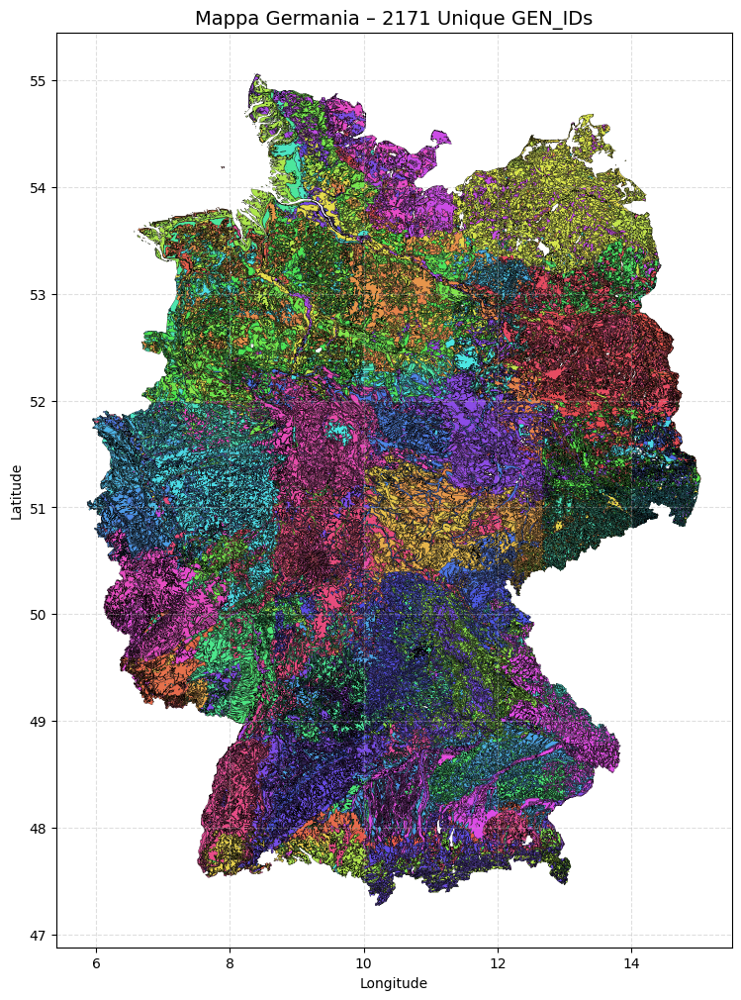

In [11]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import colorsys

# Load and reproject
gdf = gpd.read_file("buk250_with_soiltypes.geojson")
gdf = gdf.to_crs(epsg=4326)

# Drop NaNs in GEN_ID
gdf = gdf.dropna(subset=["GEN_ID"])

# Convert GEN_ID to string to preserve identity (like '13.0' vs '13')
gdf["GEN_ID"] = gdf["GEN_ID"].astype(str)

# Get unique IDs
unique_ids = sorted(gdf["GEN_ID"].unique())
n = len(unique_ids)
print(f"Plotting {n} unique GEN_IDs")

# Generate distinct HLS colors
def generate_hls_colors(n, lightness=0.6, saturation=0.75):
    return [
        mcolors.to_hex(colorsys.hls_to_rgb(i / n, lightness, saturation))
        for i in range(n)
    ]

# Map colors
color_map = dict(zip(unique_ids, generate_hls_colors(n)))
gdf["color"] = gdf["GEN_ID"].map(color_map)

# Plotting
fig, ax = plt.subplots(figsize=(12, 12))
gdf.plot(color=gdf["color"], edgecolor="black", linewidth=0.2, ax=ax)

ax.set_title("Mappa Germania – 2171 Unique GEN_IDs", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True, linestyle="--", alpha=0.4)

fig.savefig("per_presentazione/analisi_terreno/mappa_GENID_fixed.png", dpi=300)
plt.show()
